# Importações e Bibliotecas

In [1]:
import random # Operações de aleatoriedade
import sys # Operações do sistema (print, etc)
import statistics # Operações de estatística

In [2]:
from market import Market, Produto # Importa a classe Market e a classe Produto

In [3]:
# Importações para construção gráfica do melhor indivíduo e do gráfico de evolução
from PIL import Image
from IPython.display import display
import plotly.graph_objects as go

# Valores Estáticos

In [4]:
CART: dict = {
    'Altura': 65,
    'Largura': 50,
    'Comprimento': 80,
    'PesoMaximo': 460*1000
}
CART['Capacidade'] = CART['Altura'] * CART['Largura'] * CART['Comprimento']

CART

{'Altura': 65,
 'Largura': 50,
 'Comprimento': 80,
 'PesoMaximo': 460000,
 'Capacidade': 260000}

In [5]:
MAX_MONEY: float = 750.0
MAX_ITEMS: int = 100
MAX_CARTS: int = 150
MAX_GENERATIONS: int = 3000
BESTS: int = 2

In [6]:
MED_PRICE: float = MAX_MONEY/MAX_ITEMS
f"Preço Médio por Produto: R${MED_PRICE:.2f}"

'Preço Médio por Produto: R$7.50'

# Funções

In [7]:
m: Market = Market(r"..\data\produtos2.csv")
print(m)

Market Info
8465 products loaded.


In [8]:
def mosaic(cart: list[Produto], row_quantity: int = 5, image_size: tuple[int, int] = (300, 300)) -> None:
    """Cria um mosaico com as imagens dos produtos do carrinho"""
    
    # Lista o objeto das imagens
    images: list[Image] = [product.show(popup=False).resize(image_size) for product in cart]
    
    # Calcula o tamanho do mosaico
    mosaic_size: tuple[int, int] = (image_size[0]*row_quantity, image_size[1]*((len(images)//row_quantity)+1))
    
    # Cria a imagem do mosaico
    mosaic: Image = Image.new('RGB', mosaic_size)
    
    # Coloca as imagens no mosaico
    for i, image in enumerate(images):
        mosaic.paste(image, (image_size[0]*(i%row_quantity), image_size[1]*(i//row_quantity)))
    
    # Exibe o mosaico
    display(mosaic) 

In [9]:
def plot_generations(data: dict[int, dict[str, float]]) -> None:
    """Plota um gráfico com os valores de cada geração"""
    
    # Extrai as iterações e os valores
    iterations: list = list(data.keys())
    max_values: list = [data[i]['max'] for i in iterations]
    min_values: list = [data[i]['min'] for i in iterations]
    avg_values: list = [data[i]['med'] for i in iterations]

    # Cria o objeto gráfico
    fig = go.Figure()

    # Adiciona as linhas para cada variável
    fig.add_trace(go.Scatter(x=iterations, y=max_values, mode='lines+markers', name='Max', line=dict(color="#a90000")))
    fig.add_trace(go.Scatter(x=iterations, y=min_values, mode='lines+markers', name='Min', line=dict(color="#007d1d")))
    fig.add_trace(go.Scatter(x=iterations, y=avg_values, mode='lines+markers', name='Medio', line=dict(color="#356fa8")))

    # Adiciona título e rótulos
    fig.update_layout(
                    title='Gráfico de Gerações',
                    xaxis_title='Iteração',
                    yaxis_title='Valores',
                    yaxis_type='log',  #! Define o eixo y como logarítmico
                    template='plotly'
                )

    # Exibe o gráfico
    fig.show()

In [10]:
def calculate_regression(data: dict, last: int = globals()['MAX_GENERATIONS']//5) -> float:
    """ Calcula a regressão linear dos valores de uma lista de gerações das últimas N gerações """
    
    # Se a quantidade de dados for menor que o mínimo, retorna infinito
    if len(data) < last:
        return float("inf")
    
    else:
        values: list = list(data.values())[-last:]
        return statistics.stdev([value.get('min') for value in values])

In [11]:
def instanciate(cart: list[int]) -> list[Produto]:
    """Instancia uma lista de produtos a partir de uma lista de IDs"""
    
    return [m.get(i) for i in cart]

In [12]:
def info(cart: list[int]) -> str:
    """ Retorna uma string com as informações do indivíduo/carrinho """
    nota: float = avaliar(cart)
    cart: list[Produto] = instanciate(cart)
    return f"[INDIVÍDUO]\n\
Nota: {nota}\n\
Tamanho: {len(cart)}\n\n\
[INFORMAÇÕES DO CARRINHO]\n\
Preço Total: R${sum([product.price for product in cart]):.2f}\n\
Peso Total: {sum([product.weight for product in cart])/1000:.2f}g\n\
Volume Total: {sum([product.volume for product in cart]):.2f}cm³\n\
Preço médio: R${sum([product.price for product in cart])/len(cart)}\n\n\
[PRODUTOS]\n\
Menor preço: R${min([product.price for product in cart])}\n\
Maior preço: R${max([product.price for product in cart])}\n\
Menor peso: {min([product.weight for product in cart])}g\n\
Maior peso: {max([product.weight for product in cart])}g\n\
Menor volume: {min([product.volume for product in cart])}cm³\n\
Maior volume: {max([product.volume for product in cart])}cm³\n\n\
[CATEGORIAS]:\n{"\n".join([f"- {category}: {[product.category for product in cart].count(category)}" for category in set([product.category for product in cart])])}\n\n\
[LISTAGEM]\n{"\n".join([f"{product.name} \t R${product.price:.2f} \t {product.weight:.2f}g \t {product.volume:.2f}cm³" for product in cart])}\n\
"

# Genético

### Geração de Indivíduos

In [13]:
def gerar_carrinho(tamanho: int = globals()['MAX_ITEMS']) -> list[int]:
    compra = []

    while len(compra) < tamanho:
        item: int = m.random()
        compra.append(item)
        
    return compra

In [14]:
c: list[int] = gerar_carrinho()
c

[1606630,
 1613340,
 176320,
 1571148,
 1616770,
 499770,
 1441769,
 319150,
 439909,
 1052620,
 120014,
 433389,
 272569,
 1614205,
 1615404,
 291603,
 1072998,
 1614790,
 403529,
 463903,
 1614845,
 262471,
 399943,
 1572622,
 77403,
 190934,
 1623245,
 456189,
 321998,
 433020,
 618753,
 87810,
 332799,
 1575887,
 458759,
 59399,
 37264,
 1616600,
 1387085,
 198057,
 452875,
 472793,
 1616383,
 294639,
 171818,
 323205,
 1614783,
 1307783,
 622038,
 1452962,
 225395,
 1568062,
 57898,
 477929,
 336102,
 297557,
 313057,
 1447542,
 171719,
 143315,
 38054,
 696191,
 1623551,
 315927,
 15088,
 1435290,
 1619070,
 1373112,
 1420325,
 345289,
 393971,
 1593258,
 360149,
 427795,
 342436,
 473944,
 430628,
 1607125,
 136537,
 421804,
 219413,
 1513669,
 1103339,
 505562,
 129104,
 1617147,
 54631,
 1446453,
 265226,
 430076,
 444740,
 189013,
 340988,
 1616106,
 323047,
 690964,
 174803,
 287375,
 1618918,
 330231]

### Geração de População Inicial

In [15]:
def gerar_populacao(tamanho: int = globals()['MAX_CARTS']) -> list[list[int]]:
    return [gerar_carrinho() for _ in range(tamanho)]

In [16]:
p: list[list[int]] = gerar_populacao()
p

[[1532413,
  1619080,
  271570,
  1623347,
  401843,
  477929,
  1618531,
  1124406,
  474079,
  334112,
  589,
  133390,
  468932,
  1618580,
  349832,
  332787,
  1575081,
  452790,
  122940,
  62145,
  1618856,
  23925,
  108484,
  793672,
  428968,
  1618771,
  464455,
  1616940,
  466110,
  153708,
  476527,
  1602375,
  1623280,
  438271,
  1287362,
  305398,
  1461022,
  457499,
  446140,
  457439,
  1615098,
  350015,
  1545260,
  468357,
  1614179,
  442256,
  100884,
  495812,
  324051,
  1420724,
  313714,
  563493,
  308261,
  1624084,
  1376291,
  115579,
  433152,
  1446583,
  429390,
  1618762,
  176287,
  1462262,
  811076,
  617214,
  1607124,
  1446200,
  1462256,
  1616538,
  1461054,
  1609311,
  430510,
  1556321,
  1568683,
  1614229,
  321139,
  1609285,
  421814,
  302901,
  665352,
  37264,
  64265,
  1616647,
  1496553,
  617252,
  107321,
  430267,
  479115,
  138068,
  1590396,
  216164,
  77516,
  1606341,
  28249,
  444034,
  1623311,
  1617336,
  419309,


### Avaliação

In [17]:
def avaliar(individuo: list[int]) -> float:
    valor_total: float = 0.0
    peso_total: float = 0.0
    volume_total: float = 0.0
    repeticoes: int = 0
    categorias: list = []
    
    pesos = {
    'essencial': 0.35,
    'alimentos': 0.25,
    'açougue': 0.10,
    'beleza-e-perfumaria': 0.05,
    'bebidas': 0.10,
    'bebidas-alcoolicas': 0.015,
    'bebidas-alcoolicas-': 0.015,
    'limpeza': 0.05,
    'cuidados-pessoais': 0.07
}


    
    for id in individuo:
        produto = m.get(id)
        volume_total+=produto.volume
        peso_total+=produto.weight
        valor_total+=produto.price
        categorias.append(produto.category)
        r=individuo.count(id)
        repeticoes+=(r*2) if r > 1 else 0
        
        
    nota = 1
    
    # Ônus
    nota*= max(1, volume_total - globals()['CART']['Capacidade'])
    nota*= max(1, peso_total - globals()['CART']['PesoMaximo'])
    nota*= max(1, valor_total - globals()['MAX_MONEY'])
    nota*= max(1, repeticoes)

    
    # quanto maior o peso da categoria, menor a penalizacao
    repeticoes_categoria = sum([(1 / pesos[c]) * categorias.count(c)**2 for c in set(categorias)])

    # atualizacao proporcional da nota
    # soma 1 para garantir que a nota nao seja multiplicada por um decimal, que consequentemente diminuiria a nota
    nota *= (1 + repeticoes_categoria / len(individuo))
    
    # Bônus
    nota/= len(set(categorias))**2
    
    return nota**2 


In [18]:
n: float = avaliar(c)
n

9.513710774464486e+16

In [19]:
def mapear_notas(populacao: list[list[int]], order: str = 'asc') -> dict[float, list[int]]:
    notas: dict = {avaliar(individuo): individuo for individuo in populacao}
    
    if order == 'asc':
        return dict(sorted(notas.items()))
    
    else:
        return dict(sorted(notas.items(), reverse=True))

In [20]:
nt: dict[float, list[int]] = mapear_notas(p)
nt

{6851615.367772345: [26017,
  709888,
  1617144,
  1613384,
  61853,
  648361,
  1592484,
  44847,
  1598115,
  397238,
  715780,
  140452,
  70505,
  452867,
  595320,
  273428,
  1539001,
  36550,
  1462261,
  347351,
  391880,
  1617336,
  452759,
  104309,
  1613313,
  1623277,
  1548838,
  1515095,
  29497,
  585379,
  1373100,
  457917,
  61403,
  80070,
  387470,
  292387,
  1412851,
  424294,
  89512,
  385103,
  1615790,
  451184,
  617215,
  323696,
  628720,
  69603,
  297278,
  396845,
  308261,
  334191,
  5361,
  1593265,
  139332,
  1376750,
  170820,
  200215,
  87507,
  64382,
  1625287,
  1619257,
  1616550,
  795990,
  470471,
  754845,
  157222,
  21857,
  17060,
  175580,
  1614041,
  304821,
  1624218,
  439686,
  433094,
  110413,
  448140,
  1614885,
  1433150,
  1616641,
  194042,
  485187,
  176082,
  176310,
  333705,
  343055,
  1595866,
  71097,
  1447540,
  87133,
  176462,
  811047,
  424300,
  26530,
  1624091,
  454974,
  1609413,
  433160,
  221758,
  

### Seleção

In [21]:
def torneio(populacao: list[list[int]]) -> list[list[int]]:
    vencedores: list[list[int] | None] = []
    
    while len(vencedores) < 2:
        competidores: list[list[int]] = random.sample(populacao, 2)
        
        if avaliar(competidores[0]) < avaliar(competidores[1]):
            vencedor: list[int] = competidores[0]
        
        else:
            vencedor: list[int] = competidores[1]             

        if vencedor not in vencedores:    
            vencedores.append(vencedor)
    
    return vencedores

In [22]:
v1: list[list[int]] = torneio(p)
v1

[[1613349,
  355907,
  1619080,
  440142,
  42004,
  708613,
  459740,
  71561,
  456128,
  181549,
  1386007,
  1466942,
  334120,
  389022,
  1617343,
  494352,
  93950,
  178400,
  169055,
  433491,
  452759,
  435287,
  321138,
  396845,
  325755,
  245376,
  386730,
  399446,
  1616758,
  1614885,
  146771,
  219238,
  1052594,
  1587805,
  331251,
  1616120,
  168066,
  1602364,
  313713,
  401843,
  412721,
  448142,
  682262,
  1602372,
  424294,
  31117,
  450570,
  314440,
  426887,
  309366,
  796012,
  1602370,
  145718,
  1536225,
  306342,
  70405,
  1600466,
  197339,
  1591455,
  334174,
  467420,
  73227,
  32603,
  1624024,
  1568236,
  435409,
  268022,
  1378061,
  385838,
  1128685,
  20476,
  1591454,
  1615244,
  1570318,
  1614937,
  1569248,
  408424,
  1536207,
  433118,
  1378057,
  241267,
  1618493,
  440904,
  1623298,
  83818,
  459470,
  344412,
  584604,
  1462270,
  273592,
  321141,
  413161,
  12628,
  48135,
  1624285,
  9067,
  148084,
  458504,
  

In [23]:
def roleta_viciada(populacao: list[list[int]]) -> list[list[int]]:
    fitness_list: list[float] = [1 / avaliar(individuo) for individuo in populacao]
    total_fitness: float = sum(fitness_list)
    probabilities: list[float] = [fitness / total_fitness for fitness in fitness_list]
    
    vencedores: list[list[int]] = random.choices(populacao, weights=probabilities, k=2)
    
    return vencedores

In [24]:
v2: list[list[int]] = roleta_viciada(p)
v2

[[1614043,
  339013,
  1548883,
  622051,
  1450018,
  409407,
  1435088,
  410784,
  152014,
  106912,
  1623480,
  1607113,
  9461,
  791397,
  265262,
  1625284,
  292386,
  580722,
  321984,
  1614269,
  1613394,
  690955,
  281810,
  472082,
  416085,
  1613920,
  1070209,
  132031,
  407873,
  52212,
  1386007,
  224285,
  172342,
  1462885,
  1340695,
  134558,
  290984,
  39605,
  1618883,
  84689,
  1609411,
  1515080,
  357245,
  385168,
  428964,
  472453,
  467746,
  1385733,
  145580,
  1551393,
  1108003,
  754845,
  304427,
  80746,
  512746,
  1103342,
  423535,
  321125,
  314775,
  642797,
  658736,
  1119427,
  134194,
  1461109,
  321063,
  1065157,
  1623622,
  111902,
  394146,
  197960,
  1440314,
  72429,
  472637,
  804256,
  83347,
  1616630,
  1624024,
  1619129,
  1606360,
  616126,
  94981,
  140383,
  455759,
  1619274,
  95647,
  807863,
  173674,
  1602366,
  1404752,
  103139,
  472457,
  1615115,
  221359,
  53376,
  431979,
  1539938,
  569725,
  1616

In [25]:
def eugenia(populacao: list[list[int]], order: str = 'asc') -> list[list[int]]:
    notas: dict[float, list[int]] = mapear_notas(populacao, order)
    melhores: list[list[int]] = list(notas.values())[:globals()['BESTS']]
    
    return melhores

In [26]:
e: list[list[int]] = eugenia(p)
e

[[26017,
  709888,
  1617144,
  1613384,
  61853,
  648361,
  1592484,
  44847,
  1598115,
  397238,
  715780,
  140452,
  70505,
  452867,
  595320,
  273428,
  1539001,
  36550,
  1462261,
  347351,
  391880,
  1617336,
  452759,
  104309,
  1613313,
  1623277,
  1548838,
  1515095,
  29497,
  585379,
  1373100,
  457917,
  61403,
  80070,
  387470,
  292387,
  1412851,
  424294,
  89512,
  385103,
  1615790,
  451184,
  617215,
  323696,
  628720,
  69603,
  297278,
  396845,
  308261,
  334191,
  5361,
  1593265,
  139332,
  1376750,
  170820,
  200215,
  87507,
  64382,
  1625287,
  1619257,
  1616550,
  795990,
  470471,
  754845,
  157222,
  21857,
  17060,
  175580,
  1614041,
  304821,
  1624218,
  439686,
  433094,
  110413,
  448140,
  1614885,
  1433150,
  1616641,
  194042,
  485187,
  176082,
  176310,
  333705,
  343055,
  1595866,
  71097,
  1447540,
  87133,
  176462,
  811047,
  424300,
  26530,
  1624091,
  454974,
  1609413,
  433160,
  221758,
  10930,
  1624653,
 

### Crossover e Mutação

In [27]:
def cruzamento(pais: list[list[int]], chance: float = 0.80, num_pontos_corte: int = 3) -> list[list[int]]:
    pai_1: list[int] = pais[0]
    pai_2: list[int] = pais[1]

    probabilidade: float = round(random.uniform(0, 1), 2)
    if probabilidade < chance:
        pontos_corte: list[int] = sorted(random.sample(range(1, len(pai_1)), num_pontos_corte))

        filho_1: list[int | None] = []
        filho_2: list[int | None] = []

        pos_inicio: int = 0
        for i in range(num_pontos_corte):
            pos_fim = pontos_corte[i]
            filho_1 += pai_1[pos_inicio:pos_fim] if i % 2 == 0 else pai_2[pos_inicio:pos_fim]
            filho_2 += pai_2[pos_inicio:pos_fim] if i % 2 == 0 else pai_1[pos_inicio:pos_fim]
            pos_inicio = pos_fim

        # Adicionando a parte restante do genoma após o último ponto de corte
        filho_1 += pai_2[pos_inicio:]
        filho_2 += pai_1[pos_inicio:]

        return [filho_1, filho_2]

    else:
        return [pai_1, pai_2]

In [28]:
f: list[list[int]] = cruzamento(v1)
f

[[1613349,
  355907,
  1619080,
  440142,
  452970,
  383136,
  1616334,
  239676,
  67560,
  1614975,
  1624141,
  1466942,
  334120,
  389022,
  1617343,
  494352,
  93950,
  178400,
  169055,
  433491,
  452759,
  435287,
  321138,
  396845,
  325755,
  245376,
  386730,
  399446,
  1616758,
  1614885,
  146771,
  219238,
  1052594,
  1587805,
  331251,
  1616120,
  168066,
  1602364,
  313713,
  401843,
  412721,
  448142,
  682262,
  1602372,
  424294,
  31117,
  450570,
  314440,
  426887,
  309366,
  796012,
  1602370,
  145718,
  1536225,
  306342,
  70405,
  1600466,
  197339,
  1591455,
  334174,
  467420,
  73227,
  32603,
  1624024,
  1568236,
  435409,
  268022,
  1378061,
  385838,
  1128685,
  20476,
  1591454,
  1615244,
  1570318,
  1614937,
  1569248,
  408424,
  1536207,
  433118,
  1378057,
  241267,
  1618493,
  440904,
  1623298,
  83818,
  459470,
  344412,
  584604,
  1462270,
  273592,
  321141,
  413161,
  12628,
  48135,
  423702,
  632099,
  98878,
  97199,


In [29]:
def mutar(populacao: list[list[int]], chance = 0.03) -> list[list[int]]: 
    mutados: list[list[int]] = []

    for individuo in populacao:
        for pos, alelo in enumerate(individuo):
            mutacao: float = round(random.uniform(0, 1), 3)

            if mutacao < chance:
                novo_gene: str = m.random(ignore_case=[alelo,]) 
                individuo: str = individuo[:pos] + [novo_gene] + individuo[pos+1:]

        mutados.append(individuo)
    
    return mutados

In [30]:
mt: list[list[Produto]] = mutar(f)
mt

[[1613349,
  355907,
  1619080,
  440142,
  452970,
  383136,
  1616334,
  239676,
  67560,
  1614975,
  1624141,
  1466942,
  334120,
  389022,
  1617343,
  494352,
  93950,
  178400,
  169055,
  433491,
  452759,
  435287,
  321138,
  396845,
  325755,
  245376,
  386730,
  399446,
  1616758,
  1614885,
  146771,
  219238,
  1052594,
  1587805,
  331251,
  1616120,
  168066,
  1602364,
  313713,
  401843,
  412721,
  448142,
  682262,
  1602372,
  327752,
  31117,
  450570,
  314440,
  426887,
  309366,
  796012,
  1602370,
  145718,
  1536225,
  306342,
  70405,
  1600466,
  197339,
  1591455,
  334174,
  467420,
  73227,
  32603,
  1624024,
  1568236,
  435409,
  268022,
  1378061,
  385838,
  1128685,
  20476,
  1591454,
  1615244,
  1570318,
  1614937,
  624801,
  408424,
  1536207,
  433118,
  1378057,
  241267,
  1618493,
  440904,
  1623298,
  83818,
  459470,
  344412,
  584604,
  1462270,
  273592,
  321141,
  413161,
  12628,
  48135,
  423702,
  632099,
  98878,
  174803,


# Execução Principal

In [31]:
relatorio: dict[dict[str: float]] = {}

In [32]:
if __name__ == '__main__':
    i: int = 1
    populacao_atual: list[list[int]] = gerar_populacao()
    notas: list[float | None] = list(mapear_notas(populacao_atual).keys())
    
    while (i <= MAX_GENERATIONS) and (calculate_regression(relatorio) >= 1) and (0 not in notas):
        geracao: list[list[int]] = []
        
        while len(geracao) < (MAX_CARTS - BESTS):
            pais: list[list[int]] = torneio(populacao_atual)
            # pais: list[list[int]] = roleta_viciada(populacao_atual)
            
            filhos: list[list[int]] = mutar(cruzamento(pais))
            geracao.extend(filhos)
            
        geracao.extend(eugenia(populacao_atual))
        
        populacao_atual: list[list[int]] = geracao.copy()
        notas: list[float] = list(mapear_notas(populacao_atual).keys())
        relatorio[i] = {'max': max(notas), 'min': min(notas), 'med': statistics.median(notas)}
        sys.stdout.write(f'\rGeração: {i}\n')
        i+=1

Geração: 1
Geração: 2
Geração: 3
Geração: 4
Geração: 5
Geração: 6
Geração: 7
Geração: 8
Geração: 9
Geração: 10
Geração: 11
Geração: 12
Geração: 13
Geração: 14
Geração: 15
Geração: 16
Geração: 17
Geração: 18
Geração: 19
Geração: 20
Geração: 21
Geração: 22
Geração: 23
Geração: 24
Geração: 25
Geração: 26
Geração: 27
Geração: 28
Geração: 29
Geração: 30
Geração: 31
Geração: 32
Geração: 33
Geração: 34
Geração: 35
Geração: 36
Geração: 37
Geração: 38
Geração: 39
Geração: 40
Geração: 41
Geração: 42
Geração: 43
Geração: 44
Geração: 45
Geração: 46
Geração: 47
Geração: 48
Geração: 49
Geração: 50
Geração: 51
Geração: 52
Geração: 53
Geração: 54
Geração: 55
Geração: 56
Geração: 57
Geração: 58
Geração: 59
Geração: 60
Geração: 61
Geração: 62
Geração: 63
Geração: 64
Geração: 65
Geração: 66
Geração: 67
Geração: 68
Geração: 69
Geração: 70
Geração: 71
Geração: 72
Geração: 73
Geração: 74
Geração: 75
Geração: 76
Geração: 77
Geração: 78
Geração: 79
Geração: 80
Geração: 81
Geração: 82
Geração: 83
Geração: 84
G

In [33]:
for gen, data in relatorio.items():
    print(f'Geração: {gen} - {data}')

Geração: 1 - {'max': 5.915784611677286e+20, 'min': 6767135.393581935, 'med': 57490549.389426015}
Geração: 2 - {'max': 1.1471095976779472e+22, 'min': 3800782.2772778925, 'med': 31893921.40813812}
Geração: 3 - {'max': 1.3914120520926112e+21, 'min': 3800782.2772778925, 'med': 29443735.86297676}
Geração: 4 - {'max': 6556777941.165499, 'min': 3003843.246507921, 'med': 20816570.56499406}
Geração: 5 - {'max': 1.1759949376788742e+19, 'min': 3003843.246507921, 'med': 14974160.228254115}
Geração: 6 - {'max': 3577104769.837783, 'min': 3003843.246507921, 'med': 13841587.319026992}
Geração: 7 - {'max': 2.5076288425997878e+17, 'min': 3003843.246507921, 'med': 11157487.229512857}
Geração: 8 - {'max': 2240312942.319566, 'min': 3003843.246507921, 'med': 8954536.39265889}
Geração: 9 - {'max': 995087298.2787477, 'min': 2855519.926871804, 'med': 7608614.234279719}
Geração: 10 - {'max': 9.981700141638612e+19, 'min': 2551652.992521925, 'med': 6042837.86223951}
Geração: 11 - {'max': 1364161790.6259139, 'min'

In [34]:
plot_generations(relatorio)

In [35]:
best_individual: list[int] = eugenia(populacao_atual)[0]
best_cart: list[Produto] = instanciate(best_individual)

print(f"Última Geração: {i}\n\n", info(best_individual))

Última Geração: 691

 [INDIVÍDUO]
Nota: 1.7352989604966618
Tamanho: 100

[INFORMAÇÕES DO CARRINHO]
Preço Total: R$746.96
Peso Total: 44.91g
Volume Total: 131603.96cm³
Preço médio: R$7.469600000000001

[PRODUTOS]
Menor preço: R$1.99
Maior preço: R$32.99
Menor peso: 8.0g
Maior peso: 1600.0g
Menor volume: 1.0cm³
Maior volume: 34656.0cm³

[CATEGORIAS]:
- alimentos: 29
- beleza-e-perfumaria: 1
- essencial: 34
- bebidas-alcoolicas: 2
- bebidas-alcoolicas-: 2
- limpeza: 6
- cuidados-pessoais: 7
- açougue: 7
- bebidas: 12

[LISTAGEM]
Água Tônica Indian Prata Garrafa 200ml 	 R$4.99 	 376.90g 	 718.91cm³
Café em Cápsula Espresso Forza Tres Caixa 10 Unidades 8g Cada 	 R$15.99 	 133.50g 	 665.60cm³
Manjericão em Flocos Qualitá Pacote 5g 	 R$2.09 	 8.00g 	 127.40cm³
Molho de Tomate à Bolonhesa Pomarola Sabores Sachê 300g 	 R$5.79 	 311.80g 	 910.80cm³
Wrap Frango com Requeijão Seara Hot Hit Pacote 100g 	 R$8.69 	 100.00g 	 24.75cm³
Detergente Sanitário Pedra Bouquet de Lavanda Glade 	 R$3.99 	 33.6

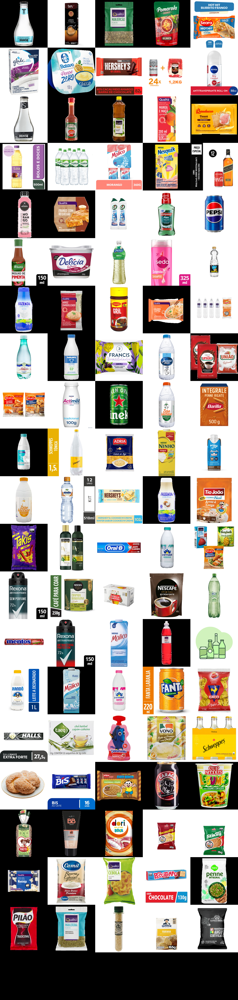

In [36]:
mosaic(best_cart)